In [ ]:
#short flow
#->Environment setup by installing required libraries
#->converting the whole pdf into images(page wise)
#->from images,filtering those pages which are having tables
#->performing ocr on selected pages from the above and converting those images into txt
#->converting all the cropped images into
#->now further filtering out the only needed cropped images from all the cropped images using llama(ai model) using those txt files
#->then finally selected cropped images will be stored into list(csv) and those will be converted into single txt file for further processing
#->txt will be seperated into chunks(due to token limit)
#->predicting the output


# **Environment Setup for OCR-Based Financial Data Extraction Pipeline**

In [ ]:
from PIL import Image
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf

In [ ]:
!pip install paddlepaddle-gpu==2.5.2
!pip install paddlepaddle-gpu==2.3.0.post110 -f https://www.paddlepaddle.org.cn/whl/linux/mkl/avx/stable.html
!pip install pdf2image
!apt-get update
!apt-get install poppler-util
!pip install pdf2image
!apt-get update
!apt-get install poppler-utils
#!python3 -m pip install paddlepaddle-gpu
!pip install "paddleocr>=2.0.1"
!pip install protobuf==3.20.0
!git clone https://github.com/PaddlePaddle/PaddleOCR.git
!wget https://paddleocr.bj.bcebos.com/whl/layoutparser-0.0.0-py3-none-any.whl
!pip install -U layoutparser-0.0.0-py3-none-any.whl

Looking in links: https://www.paddlepaddle.org.cn/whl/linux/mkl/avx/stable.html
ERROR: Could not find a version that satisfies the requirement paddlepaddle-gpu==2.3.0.post110 (from versions: 2.5.1, 2.5.1.post102, 2.5.1.post112, 2.5.1.post116, 2.5.1.post117, 2.5.1.post120, 2.5.2, 2.5.2.post102, 2.5.2.post112, 2.5.2.post116, 2.5.2.post117, 2.5.2.post120, 2.6.0, 2.6.0.post112, 2.6.0.post116, 2.6.0.post117, 2.6.0.post120, 2.6.1, 2.6.1.post112, 2.6.1.post116, 2.6.1.post117, 2.6.1.post120, 2.6.2)
ERROR: No matching distribution found for paddlepaddle-gpu==2.3.0.post110
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,306 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:6 https:

Cloning into 'PaddleOCR'...
remote: Enumerating objects: 99136, done.
remote: Counting objects: 100% (4127/4127), done.
remote: Compressing objects: 100% (515/515), done.
remote: Total 99136 (delta 3845), reused 3773 (delta 3612), pack-reused 95009 (from 3)
Receiving objects: 100% (99136/99136), 623.81 MiB | 16.38 MiB/s, done.
Resolving deltas: 100% (75473/75473), done.
Updating files: 100% (2024/2024), done.
--2025-01-31 15:54:12--  https://paddleocr.bj.bcebos.com/whl/layoutparser-0.0.0-py3-none-any.whl
Resolving paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)... 103.235.47.176, 2409:8c04:1001:1203:0:ff:b0bb:4f27
Connecting to paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)|103.235.47.176|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19145360 (18M) [application/octet-stream]
Saving to: ‘layoutparser-0.0.0-py3-none-any.whl’

layoutparser-0.0.0- 100%[===================>]  18.26M  15.3MB/s    in 1.2s    

2025-01-31 15:54:14 (15.3 MB/s) - ‘layoutparser-0.

# pdf2image

Converting the whole pdf into images

In [ ]:
from pdf2image import convert_from_path
images = convert_from_path('/content/hdfc.pdf')
!mkdir pages
for i in range(len(images)):
  images[i].save('pages/page'+str(i)+'.jpg', 'JPEG')

Helpercode

In [ ]:
# import os
# import glob

# # Path to the directory containing images
# image_folder = "/content/output_csvs"  # Change this to your directory

# # File extensions to delete
# image_extensions = ["*.jpg", "*.txt", "*.csv"]

# # Delete all images except those starting with "page"
# for ext in image_extensions:
#     for file in glob.glob(os.path.join(image_folder, ext)):
#         filename = os.path.basename(file)
#         # if not filename.startswith("page"):  # Skip files starting with "page"
#         os.remove(file)
#         print(f"Deleted: {file}")
#         # else:
#         #     print(f"Skipped: {file}")

# print("✅ Cleanup complete!")


Deleted: /content/output_csvs/cropped_page9_table.csv
Deleted: /content/output_csvs/cropped_page14_table.csv
Deleted: /content/output_csvs/cropped_page3_table.csv
Deleted: /content/output_csvs/cropped_page7_table.csv
Deleted: /content/output_csvs/cropped_page4_table.csv
Deleted: /content/output_csvs/cropped_page12_table.csv
Deleted: /content/output_csvs/cropped_page1_table.csv
Deleted: /content/output_csvs/cropped_page10_table.csv
Deleted: /content/output_csvs/cropped_page2_table.csv
Deleted: /content/output_csvs/cropped_page13_table.csv
Deleted: /content/output_csvs/cropped_page6_table.csv
Deleted: /content/output_csvs/cropped_page8_table.csv
✅ Cleanup complete!


# **Table Detection and Cropping from Document Images**

In [ ]:
import cv2
import layoutparser as lp
import os

# Function to crop images dynamically and ensure nothing is cut off
def crop_images_with_tables(directory_path):
    # Load the model once for detecting tables
    model = lp.PaddleDetectionLayoutModel(config_path="lp://PubLayNet/ppyolov2_r50vd_dcn_365e_publaynet/config",
                                          threshold=0.1,  # Lower threshold for detecting more tables
                                          label_map={0: "Text", 1: "Title", 2: "List", 3: "Table", 4: "Figure"},
                                          enforce_cpu=False,
                                          enable_mkldnn=True)

    # Iterate over all pages in the directory
    for filename in os.listdir(directory_path):
        if filename.endswith(".jpg"):  # Process only .jpg files
            image_path = os.path.join(directory_path, filename)
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is None:
                print(f"Error loading image {filename}")
                continue

            height, width, _ = image.shape  # Get image dimensions

            # Detect layout in the image (detect tables, etc.)
            layout = model.detect(image)

            # Initialize bounding box for cropping
            min_x, min_y, max_x, max_y = width, height, 0, 0

            # Iterate over detected layout elements
            for l in layout:
                if l.type == 'Table':
                    x_1 = max(0, int(l.block.x_1))  # Ensure within bounds
                    y_1 = max(0, int(l.block.y_1))
                    x_2 = min(width, int(l.block.x_2))
                    y_2 = min(height, int(l.block.y_2))

                    # Calculate an adaptive margin (5% of table size)
                    margin_x = int((x_2 - x_1) * 0.05)
                    margin_y = int((y_2 - y_1) * 0.05)

                    min_x = min(min_x, x_1 - margin_x)
                    min_y = min(min_y, y_1 - margin_y)
                    max_x = max(max_x, x_2 + margin_x)
                    max_y = max(max_y, y_2 + margin_y)

            # Ensure valid cropping area
            if min_x < max_x and min_y < max_y:
                min_x = max(0, min_x)
                min_y = max(0, min_y)
                max_x = min(width, max_x)
                max_y = min(height, max_y)

                cropped_im = image[min_y:max_y, min_x:max_x]

                # Check if the cropped image is valid
                if cropped_im.size == 0:
                    print(f"The cropped image is empty for {filename}!")
                else:
                    # Save the cropped image
                    cropped_image_filename = f"cropped_{filename.split('.')[0]}_table.jpg"
                    cv2.imwrite(os.path.join(directory_path, cropped_image_filename), cropped_im)
                    print(f"Table cropped from {filename} and saved as {cropped_image_filename}")
            else:
                print(f"No valid table detected in {filename}, no crop performed.")

# Specify the directory containing the images of pages
directory_path = "/content/pages"
crop_images_with_tables(directory_path)




Table cropped from page3.jpg and saved as cropped_page3_table.jpg
Table cropped from page6.jpg and saved as cropped_page6_table.jpg
Table cropped from page7.jpg and saved as cropped_page7_table.jpg
No valid table detected in page5.jpg, no crop performed.
Table cropped from page8.jpg and saved as cropped_page8_table.jpg
No valid table detected in page0.jpg, no crop performed.
Table cropped from page2.jpg and saved as cropped_page2_table.jpg
Table cropped from page9.jpg and saved as cropped_page9_table.jpg
Table cropped from page4.jpg and saved as cropped_page4_table.jpg
Table cropped from page13.jpg and saved as cropped_page13_table.jpg
No valid table detected in page11.jpg, no crop performed.
Table cropped from page10.jpg and saved as cropped_page10_table.jpg
No valid table detected in page15.jpg, no crop performed.
Table cropped from page14.jpg and saved as cropped_page14_table.jpg
Table cropped from page1.jpg and saved as cropped_page1_table.jpg
Table cropped from page12.jpg and save

# **Optical Character Recognition (OCR) on Cropped Table Images**

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


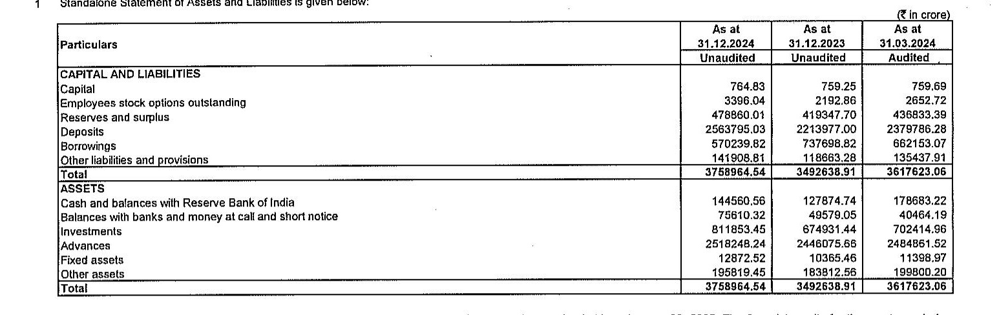

Extracted Text from cropped_page3_table.jpg:
T  - SIBNGEONS SIAISICN Ol MSsSte She LISVNNS te pve Se.

 

 

 

 

 

 

 

 

   

 

in crore)

As at As at As at

Particulars 31.12.2024 31.12.2023 31.03.2024
: [Unaudited Unaudited Audited

CAPITAL AND LIABILITIES
‘Capital 764.83 759.25 759.69
Employees stock options outstanding 3396.04 2192.86 2652.72
Reserves and surplus 478860.01 419347.70 436833,39
Deposits 2563795,03 2213977.00 2379786.28
Borrowings 570239.82 737698.82 662153.07
Other liabilities and provisions 144908.84 118663,28 135437.91
Total 3758964.54 3492638.91 | 3617623.06
ASSETS
Cash and balances with Reserve Bank of India 144560,56 127874.74 178683,22
Balances with banks and money at call and short notice 78610.32 49579.05 40464.19

811853.45 674931.44 702414.96

2518248,24 2446075.66 2484861.52
1287252 10365.46
I

 

 

3758964.54 3492638.91

 

 

 

Extracted text saved as cropped_page3_table_text.txt


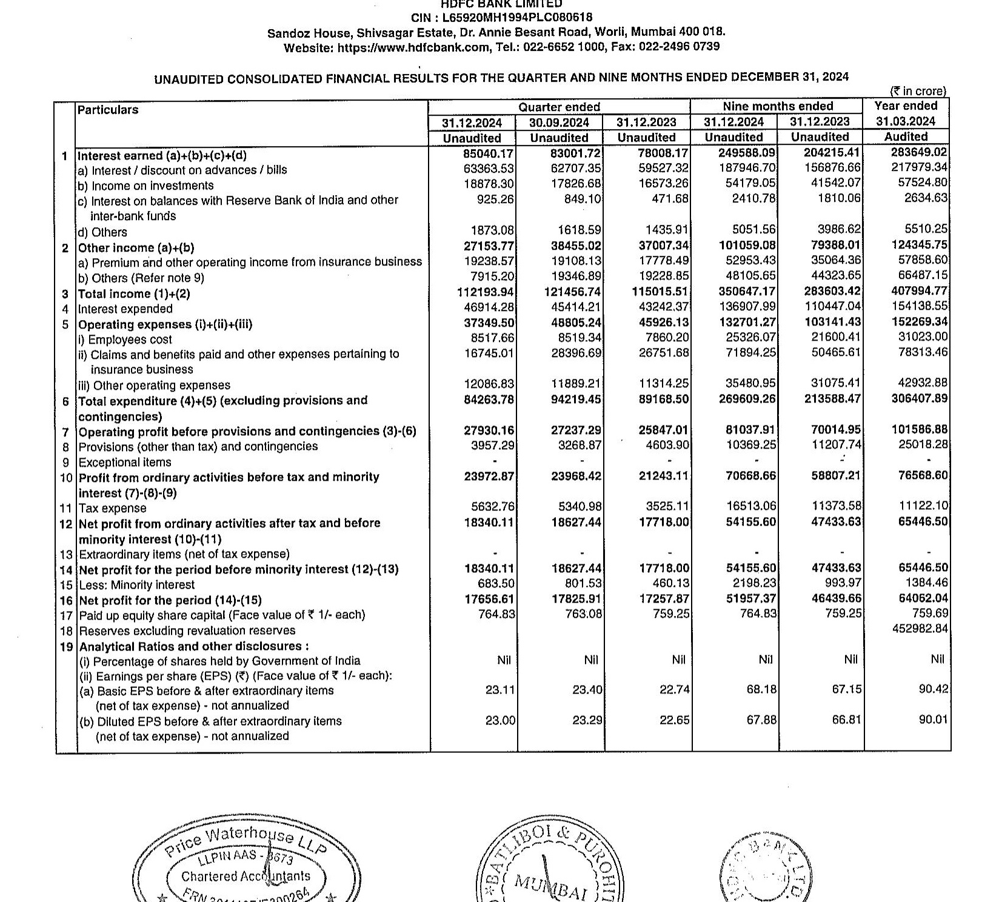

Extracted Text from cropped_page7_table.jpg:
 

OVC BANK

Ivo

CIN : L65920MH1994PLC080618
Sandoz House, Shivsagar Estate, Dr. Annie Besant Road, Worli, Mumbai 400 018.
Website: https:/Avww.hdicbank.com, Tel.: 022-6652 1000, Fax: 022-2496 0739

UNAUDITED CONSOLIDATED FINANCIAL RESULTS FOR THE QUARTER AND NINE MONTHS ENDED DECEMBER 31, 2024

 

 

 

 

 

 

@in crore}
Particulars Quarter ended Nine months ended Year ended
31.12.2024 30.09.2024 31.12,2023 31.12.2024 | 31.12.2023 31.03.2024
Unaudited Unaudited Unaudited Unaudited Unaudited Audited
1 [Interest earned (a)+(b)+(c)+(d) 85040.17| 83001,72' 78008.17 249588,09! 204215.41 283649,02
a) Interest / discount on advances / bills 63363,53 62707.35) §9527.32 187946.70; 156876.66 217979.34|
b) Income on investments 18878.30 17826.68 16673,26 54179.05} 41542.07| 57524.80|
c) Interest on balances with Reserve Bank of India and other 925.26 849.10 471.68 2410.78) 1810.06 2634.63)
inter-bank funds
ld) Others 1873.08} 1618.59) 1435.91 5051.

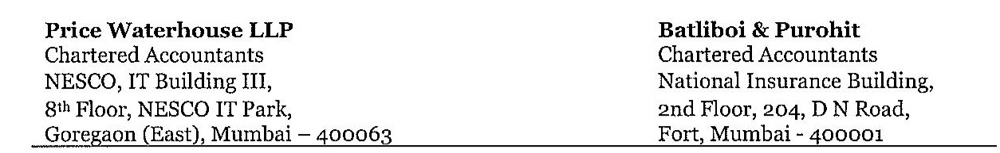

Extracted Text from cropped_page13_table.jpg:
Price Waterhouse LLP
Chartered Accountants

NESCO, IT Building UI,

8th Floor, NESCO IT Park,

Goregaon (East), Mumbai — 400063

Batliboi & Purohit
Chartered Accountants
National Insurance Building,
end Floor, 204, D N Road,
Fort, Mumbai - 400001

 

Extracted text saved as cropped_page13_table_text.txt


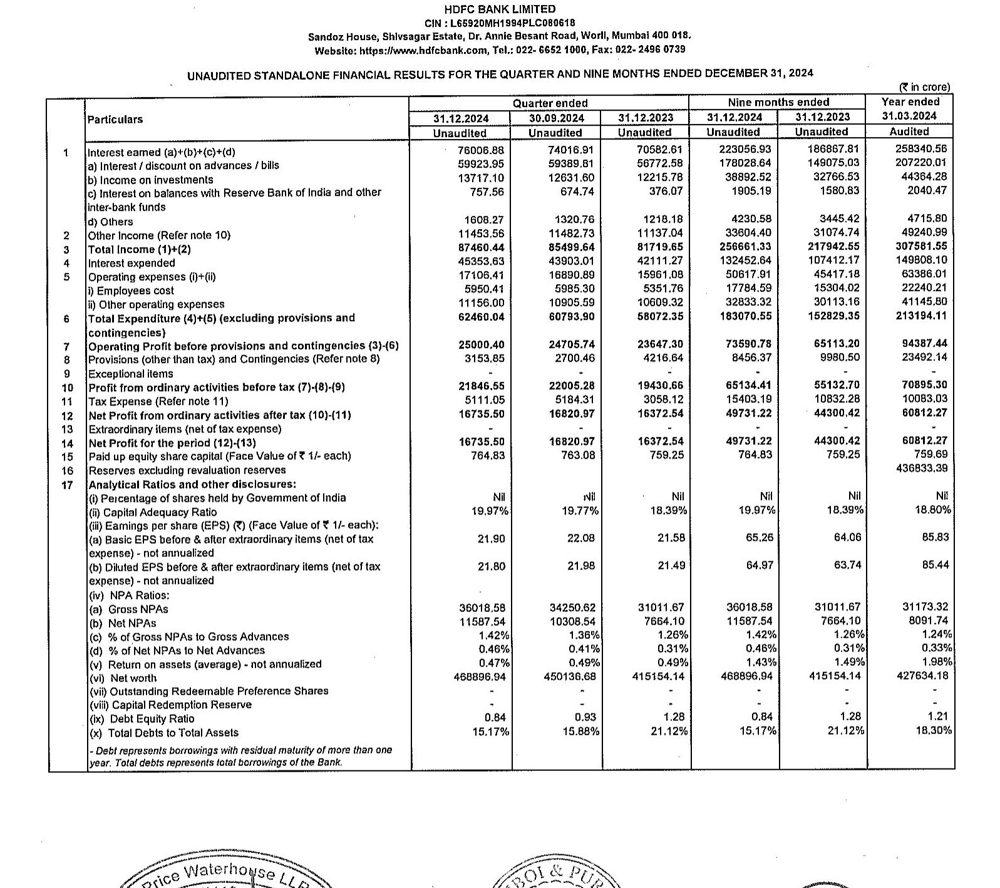

Extracted Text from cropped_page1_table.jpg:
Sandoz House, Shivsagar Estate, Dr, Annie Besant Road, Worll, Mumbai 400 048,

HDFC BANK LIMITED
CIN : L65920MH1994PLC0680618

Website: https:/fwww.hdfcbank.com, Tel.: 022. 6652 1000, Fax: 022-2496 0739

UNAUDITED STANDALONE FINANGIAL RESULTS FOR THE QUARTER AND NINE MONTHS ENDED DECEMBER 31, 2024

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

@in crore)
Quarter ended Nine months ended Year ended
Particulars 31.12.2024 30.09.2024 341,12.2023 31.12.2024 | 31.12.2023 31.03.2024
sot Unaudited. Unaudited Unaudited Unaudited Unaudited Audited

1 [Interest eamed (a)+(b)+(c)+(d) 76006.88 74016,91 70582.61 223086.93 486867.81 258340,56

a) Interest / discount on advances / bilis §9923.95 59389,81 $6772.58 178028.64 149075,03 207220,01

b} Income on investments 13717.10 12631.60 12215.78 38892.52 32766.53 4$4364,28

\c) interest on balances with Reserve Bank of India and other 757.56 674.74 376,07 1905.19 1680.83 2040.47

inter-bank funds

a) Other

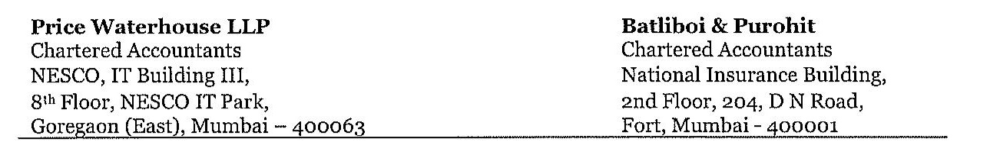

Extracted Text from cropped_page12_table.jpg:
Price Waterhouse LLP
Chartered Accountants

NESCO, IT Building IU,

8th Floor, NESCO IT Park,

Goregaon (East), Mumbai ~ 400063

Batliboi & Purohit
Chartered Accountants
National Insurance Building,
2nd Floor, 204, D N Road,
Fort, Mumbai - 400001

 

Extracted text saved as cropped_page12_table_text.txt


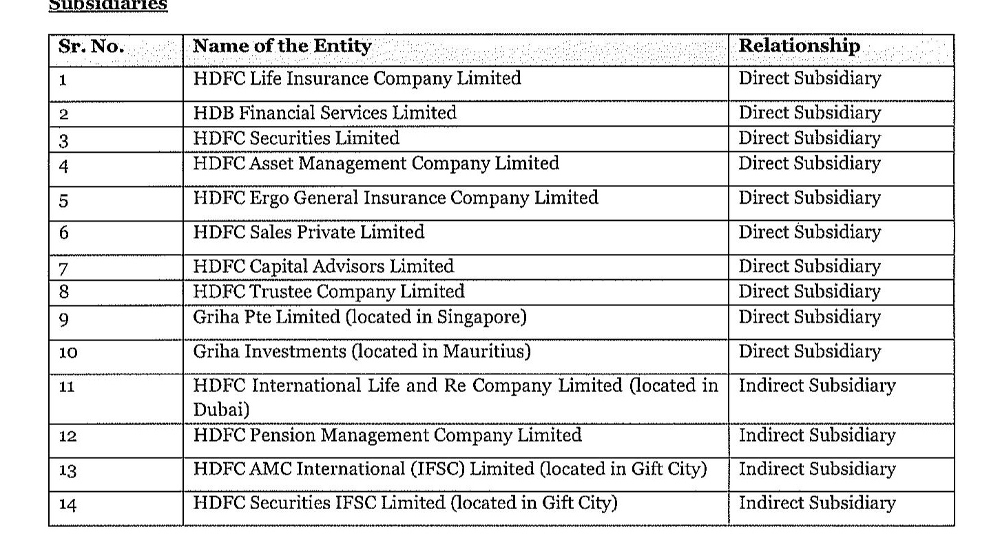

Extracted Text from cropped_page14_table.jpg:
BEHOSIl AL its

 

 

 

 

 

 

 

     

 

 

 

Sr. No. Name of the Entity Relationship
fe

1 HDFC Life Insurance Company Limited Direct Subsidiary
2 HDB Financial Services Limited Direct Subsidiary
3 HDFC Securities Limited Direct Subsidiary
4 HDFC Asset Management Company Limited Direct Subsidiary

5 HDFC Ergo General Insurance Company Limited Direct Subsidiary

6 HDFC Sales Private Limited Direct Subsidiary
7. HDFC Capital Advisors Limited Direct Subsidiary
8 HDFC Trustee Company Limited Direct Subsidiary

9 Griha Pte Limited (located in Singapore) Direct Subsidiary
10 Griha Investments (located in Mauritius) Direct Subsidiary
ret HDFC International Life and Re Company Limited (located in | Indirect Subsidiary

Dubai)

12 HDFC Pension Management Company Limited Indirect Subsidiary
13 HDFC AMC International (IFSC) Limited (located in Gift City) | Indirect Subsidiary
14 HDFC Securities IFSC Limited (located in Gift City) Indirect Subs

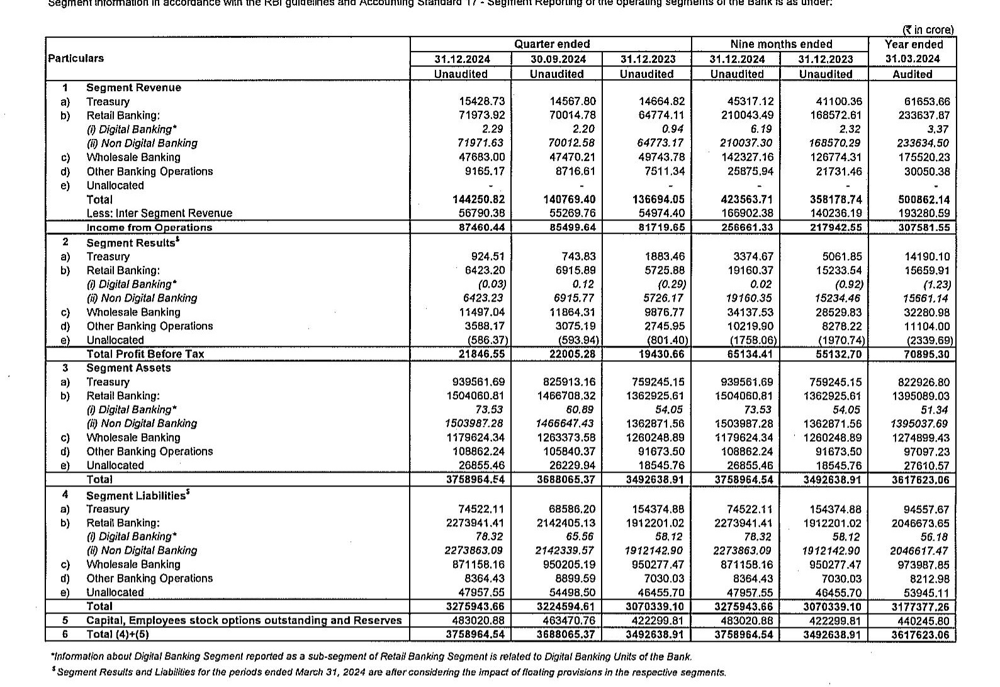

Extracted Text from cropped_page2_table.jpg:
aa UE ETT AE VISP RE REIEUIEE TED CURA DEGMSAT Tee NTU R METRE NEE RS ATM SONU TRA, She DR AON AUT USS MUR ERS TTA EE Oe PU ESSE ER DSSS peed BARES Wel ET SE: Np et SREB oe eg ehh SS DSR STEIN ke Stet LT

 

 

 

 

 

 

 

 

     

 

     
       
       
     
  
 

   
  

      

 

 

            

    

 

 
  
   

 
  
    

 
 

 

   

        
         
       
      
  
   

   
   
  

   
   

 

 

 

 

       
   
  
   
   
   

    
 
   
    
  
  
  

 

 
 
  

 

 

“Information about Digital Banking Segment reported as a sub-segment of Retail Banking Segment is related to Digital Banking Units of the Bank.
$ Segment Results and Liabilities for the periods ended March 31, 2024 are after considering the impact of floating provisions in the respective segments.

    
 
 

 

 

    
  
   
   
  
   
    
  
  

   

 

in crore)
Quarter ended Nine months ended Year ended
Particulars 34.12.2024 30.09.2024 31.12.2023 

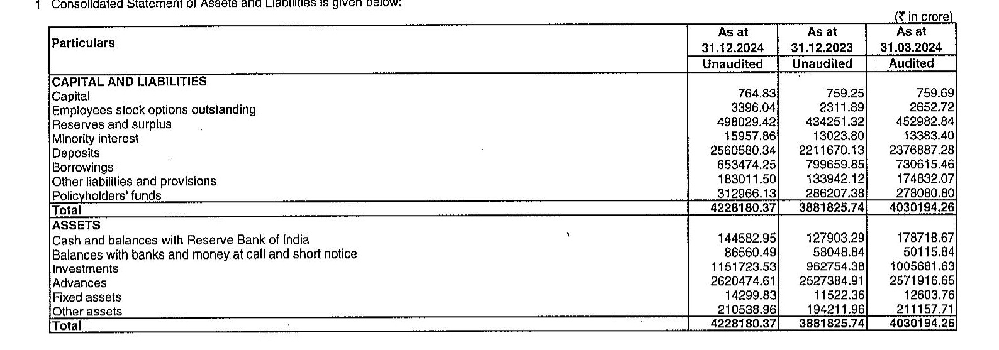

Extracted Text from cropped_page9_table.jpg:
 

Consolidated olaleMent OF ASSETS all LIGUINUES to GIVEN Dene.

 

 

   
 

     
   
 

   
 

 

 

 

 

 

 

 

 

 

(€ in crore)
Particul As at As at As at
anticulars 31.12.2024 | 34.12.2023 | 31.03.2024
Unaudited Unaudited Audited
CAPITAL AND LIABILITIES %
Capital 764.83 759,25 789.69
Employees stock options outstanding 3396.04, 2311.89 2652.72)
Reserves and surplus 498029.42) 43425 1.32) 452982.84|
Minority interest 15957.86 13023.80 43383.40
Deposits 2560580.34)  2211670,13} 2376887.28|
Borrowings 653474.25 799659.85) 730615.46]
Other liabilities and provisions 183011.50 133942.12| 174832.07|
Policyholders’ funds. 312966.13} 286207.38| 27808080}
Total 4228180.37, 3881825.74 4030194.26|
ASSETS
Cash and balances with Reserve Bank of India 144582,95 127903,29| 178718.67,
Salances with banks and money.at call and short notice 86660.49 58048.84 50115.84)
Investments 1151723.53) 962754,38| 4005681.63)
Advances 2620474.61 2527384.91 25

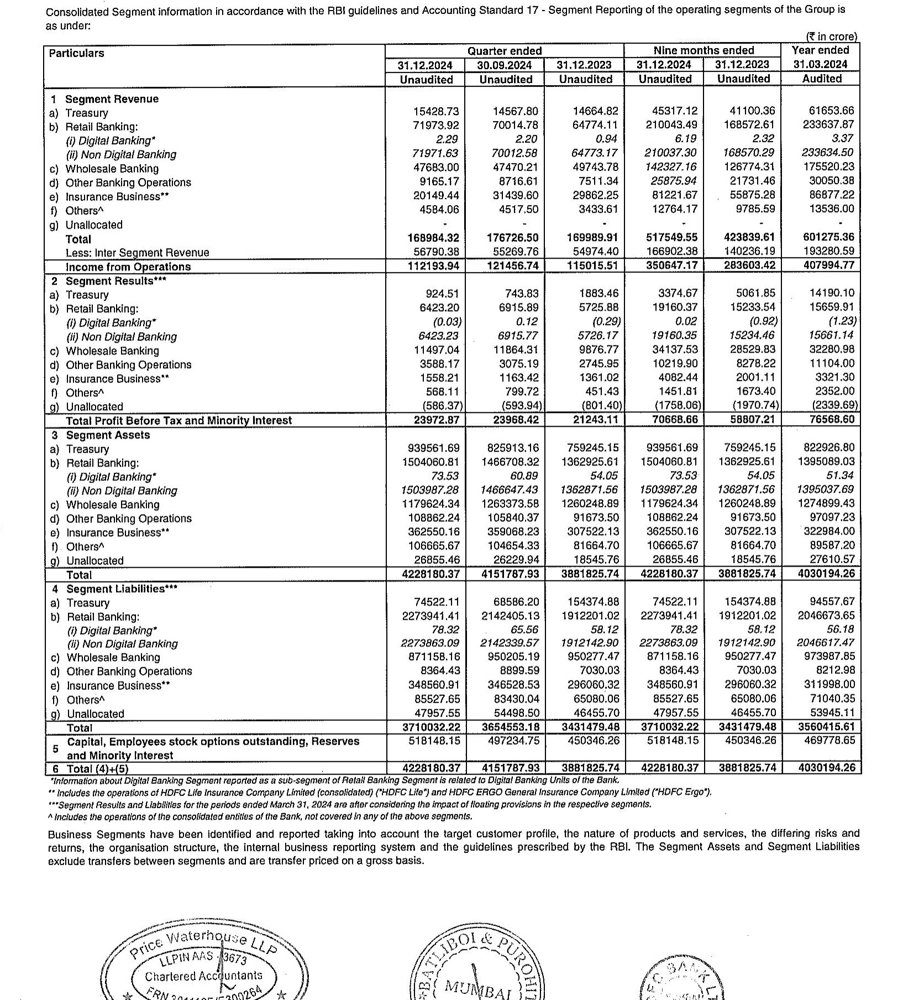

Extracted Text from cropped_page8_table.jpg:
Consolidated Segment information in accordance with the RB! guidelines and Accounting Standard 17 - Segment Reporting of the operating segments of the Group is

 

 

 

 

 

 

 

 

 

 

 

 

  

 

 

 

  
  
  

    
 
   
   
   
    

   
  

 

    
   
 

  
    
 
       
      

 

 

  

 

       
        

     
    

  

   
   
 

 

 

 

 

 

 

as under:
(Zin crore)
Particulars Quarter ended Nine months ended Year ended
31,12,2024 30.09.2024 31.12.2023 31.12.2024 | 31.12.2023 31.03.2024
Unaudited Unaudited Unaudited Unaudited | Unaudited Audited
1 Segment Revenue
a) Treasury 15428,73 14567.80 14664.82 $5317.12 41100.36 61653,66
b) Retail Banking: 71973,92 70014.78 64774.11 210043.49 168572.61 233637.87
{i) Digital Banking” 2.29 2.20 0.94 6.19 2.32 3.37
(ii) Non Digital Banking 7197163 70012.58 64773.17 210037.30 168570.29 233634.50
¢) Wholesale Banking 47683,00 47470.21 49743.78 142327.16 126774.31 178520,23
d) Other B

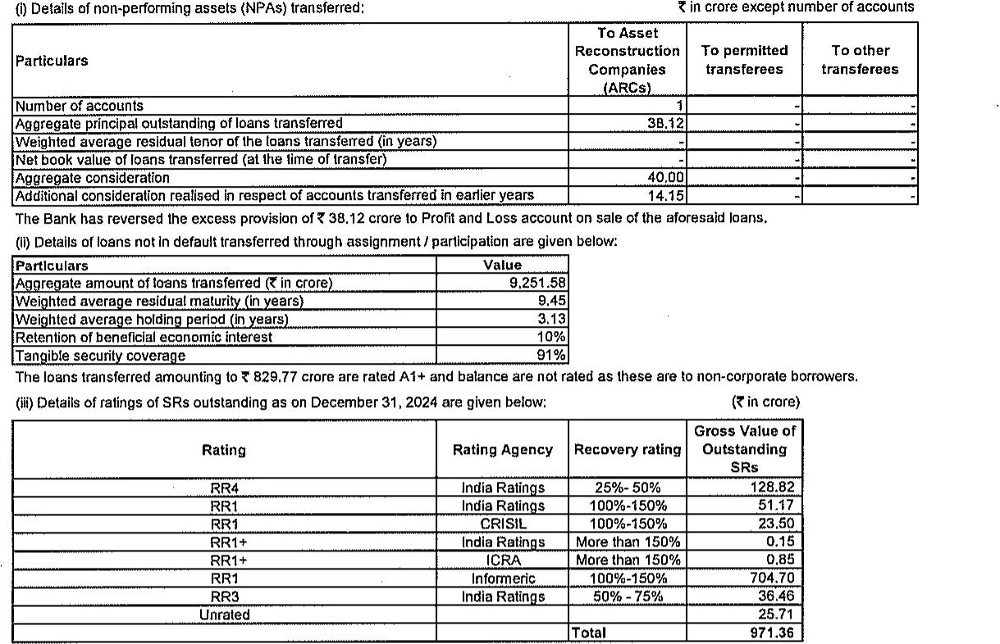

Extracted Text from cropped_page4_table.jpg:
 

{i) Details of non-performing assets (NPAs) transferred:

in crore except number of accounts

 

 

 

 

 

 

 

 

 

 

 

 

To Asset
Particulars Reconstruction | To permitted To other
Companies transferees transferees
(ARCs)
Number of accounts i -| -
Aggregate principal outstanding of loans transferred 38.42 -| ml
Weighted average residual tenor of the loans transferred {in years) | 3 a
Net book value of loans transferred (at the time of transfer) |
Aggregate consideration 40,00 | |
Additional consideration realised in respect of accounts transferred in earlier years 14.15] -| |

 

‘The Bank has reversed the excess provision of % 38,12 crore to Profit and Loss account
(i) Details of loans not in default transferred through assignment / participation are given below:

Particulars
Aggregate amount of toans transferred (@ in crore)

Value
9,251.58

 

 

 

 

 

Weighted average residual maturity (in years) 9.45}
Weighted average hol

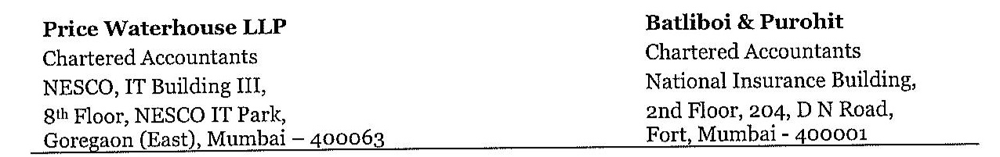

Extracted Text from cropped_page6_table.jpg:
Price Waterhouse LLP
Chartered Accountants
NESCO, IT Building ITI,

8th Floor, NESCO IT Park,
Goregaon (East), Mumbai — 400063

Batliboi & Purohit
Chartered Accountants
National Insurance Building,

end Floor, 204, D N Road,
Fort, Mumbai - 400001

Extracted text saved as cropped_page6_table_text.txt


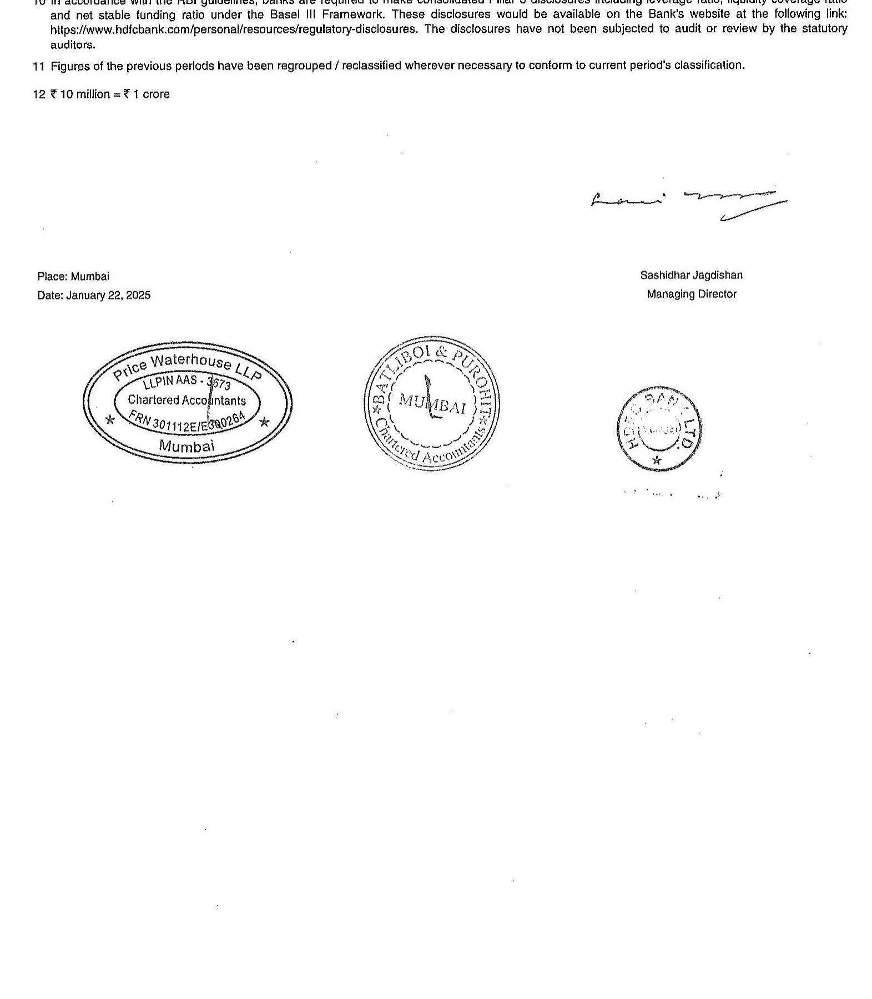

Extracted Text from cropped_page10_table.jpg:
Ee LEE RR RAE ee SRLS Se

eC ee Eee ee eRe eRe ee Tee ene eT RR eee Oe eee

SORE ee ee ee ect ee eo e

and net stable funding ratio under the Basel Ill Framework. These disclosures would be available on the Bank's website at the following link:
https:/Avww.hdfcbank.com/personal/resources/regulatory-disclosures. The disclosures have not been subjected to audit or review by the statutory

auditors.

11 Figures of the previous periods have been regrouped / reclassified wherever necessary to conform to current period's classification.

12 10 million =& 1 crore

Place: Mumbai
Date: January 22, 2025

   

ace Waterhoug,
g

   

   

Sashidhar Jagdishan
Managing Director

 

Extracted text saved as cropped_page10_table_text.txt


In [ ]:
# Install dependencies
!apt-get install -y tesseract-ocr
!pip install pytesseract opencv-python-headless

import cv2
import pytesseract
from google.colab.patches import cv2_imshow
import os

# Function to apply OCR on cropped images
def run_ocr_on_cropped_images(directory_path):
    for filename in os.listdir(directory_path):
        if filename.startswith("cropped_") and filename.endswith(".jpg"):  # Process only cropped images
            image_path = os.path.join(directory_path, filename)
            image = cv2.imread(image_path)

            if image is None:
                print(f"Error loading image {filename}")
                continue

            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            cv2_imshow(gray)

            text = pytesseract.image_to_string(gray)

            print(f"Extracted Text from {filename}:")
            print(text)

            text_filename = f"{filename.split('.')[0]}_text.txt"
            text_path = os.path.join(directory_path, text_filename)

            with open(text_path, "w", encoding="utf-8") as text_file:
                text_file.write(text)

            print(f"Extracted text saved as {text_filename}")

# Specify the directory containing cropped images
directory_path = "/content/pages"
run_ocr_on_cropped_images(directory_path)

# **Structured CSV Generation from OCR-Processed Cropped Images**

In [ ]:
from paddleocr import PaddleOCR
import tensorflow as tf
import cv2
import os
import numpy as np
import pandas as pd

# Initialize PaddleOCR with improved settings
ocr = PaddleOCR(lang='en', rec_algorithm='CRNN')

# Function to process each cropped image and generate a structured CSV
def process_images_and_generate_csv(directory_path, output_directory):
    # Ensure output directory exists
    os.makedirs(output_directory, exist_ok=True)

    # Iterate over all cropped images in the directory
    for filename in os.listdir(directory_path):
        if filename.startswith("cropped_") and filename.endswith(".jpg"):  # Process only cropped images
            cropped_image_path = os.path.join(directory_path, filename)
            image_cv = cv2.imread(cropped_image_path)

            # Check if the image is loaded correctly
            if image_cv is None:
                print(f"Error loading cropped image {filename}")
                continue

            # Perform OCR on the cropped image
            output = ocr.ocr(cropped_image_path, cls=True)

            if not output or not output[0]:  # Ensure OCR detected something
                print(f"No text detected in {filename}, skipping...")
                continue

            # Extract bounding boxes, text, and confidence scores
            boxes = [line[0] for line in output[0]]
            texts = [line[1][0] for line in output[0]]
            probabilities = [line[1][1] for line in output[0]]

            # Separate horizontal and vertical bounding boxes
            horiz_boxes, vert_boxes = [], []
            for box in boxes:
                x_h, y_h = 0, int(box[0][1])  # Full width, row-based
                width_h, height_h = image_cv.shape[1], int(box[2][1] - box[0][1])
                horiz_boxes.append([x_h, y_h, x_h + width_h, y_h + height_h])

                x_v, y_v = int(box[0][0]), 0  # Full height, column-based
                width_v, height_v = int(box[2][0] - box[0][0]), image_cv.shape[0]
                vert_boxes.append([x_v, y_v, x_v + width_v, y_v + height_v])

            # Convert to tensor format for Non-Maximum Suppression (NMS)
            horiz_boxes_tensor = tf.convert_to_tensor(horiz_boxes, dtype=tf.float32)
            vert_boxes_tensor = tf.convert_to_tensor(vert_boxes, dtype=tf.float32)
            probabilities_tensor = tf.convert_to_tensor(probabilities, dtype=tf.float32)

            # Apply NMS for horizontal (rows) and vertical (columns)
            horiz_out = tf.image.non_max_suppression(horiz_boxes_tensor, probabilities_tensor, max_output_size=500, iou_threshold=0.2)
            vert_out = tf.image.non_max_suppression(vert_boxes_tensor, probabilities_tensor, max_output_size=500, iou_threshold=0.2)

            # Sort detected lines and columns properly
            horiz_lines = np.sort(np.array(horiz_out))
            vert_lines = np.sort(np.array(vert_out))

            # Prepare an empty matrix for structured CSV
            out_array = [["" for _ in range(len(vert_lines))] for _ in range(len(horiz_lines))]

            unordered_boxes = [vert_boxes[i][0] for i in vert_lines]
            ordered_boxes = np.argsort(unordered_boxes)

            # Helper function: Calculate Intersection over Union (IoU)
            def iou(box1, box2):
                x1 = max(box1[0], box2[0])
                y1 = max(box1[1], box2[1])
                x2 = min(box1[2], box2[2])
                y2 = min(box1[3], box2[3])
                inter_area = max(0, x2 - x1) * max(0, y2 - y1)
                box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
                box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
                return inter_area / float(box1_area + box2_area - inter_area) if inter_area > 0 else 0

            # Assign text to the correct cell in the matrix
            for i in range(len(horiz_lines)):
                for j in range(len(vert_lines)):
                    target_box = [vert_boxes[vert_lines[ordered_boxes[j]]][0], horiz_boxes[horiz_lines[i]][1],
                                  vert_boxes[vert_lines[ordered_boxes[j]]][2], horiz_boxes[horiz_lines[i]][3]]
                    for b in range(len(boxes)):
                        detected_box = [boxes[b][0][0], boxes[b][0][1], boxes[b][2][0], boxes[b][2][1]]
                        if iou(target_box, detected_box) > 0.2:
                            out_array[i][j] = texts[b]

            # Convert the list to a DataFrame
            df = pd.DataFrame(out_array)

            # Remove empty columns and rows
            df = df.loc[:, (df != "").any(axis=0)]  # Remove empty columns
            df = df.loc[(df != "").any(axis=1), :]  # Remove empty rows


            # Save to CSV
            output_csv_path = os.path.join(output_directory, f"{filename.split('.')[0]}.csv")
            df.to_csv(output_csv_path, index=False, header=False)
            print(f"✅ Data saved to {output_csv_path}")

# Specify input and output directories
directory_path = "/content/pages"  # Folder containing cropped images
output_directory = "/content/output_csvs"  # Folder to save CSVs

# Run the function
process_images_and_generate_csv(directory_path, output_directory)




[2025/01/31 17:25:34] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=True, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='CRNN', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dic

Testing output only

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


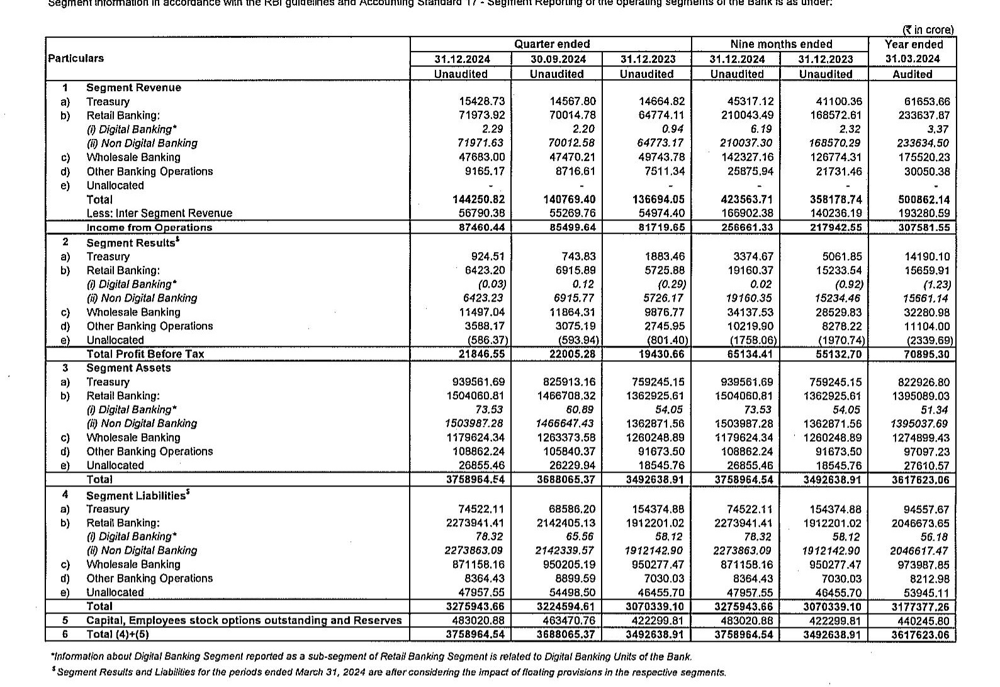

Extracted Text:
aa UE ETT AE VISP RE REIEUIEE TED CURA DEGMSAT Tee NTU R METRE NEE RS ATM SONU TRA, She DR AON AUT USS MUR ERS TTA EE Oe PU ESSE ER DSSS peed BARES Wel ET SE: Np et SREB oe eg ehh SS DSR STEIN ke Stet LT

 

 

 

 

 

 

 

 

     

 

     
       
       
     
  
 

   
  

      

 

 

            

    

 

 
  
   

 
  
    

 
 

 

   

        
         
       
      
  
   

   
   
  

   
   

 

 

 

 

       
   
  
   
   
   

    
 
   
    
  
  
  

 

 
 
  

 

 

“Information about Digital Banking Segment reported as a sub-segment of Retail Banking Segment is related to Digital Banking Units of the Bank.
$ Segment Results and Liabilities for the periods ended March 31, 2024 are after considering the impact of floating provisions in the respective segments.

    
 
 

 

 

    
  
   
   
  
   
    
  
  

   

 

in crore)
Quarter ended Nine months ended Year ended
Particulars 34.12.2024 30.09.2024 31.12.2023 34.42.2024 34.12,2023 31.03.2

In [ ]:
# # Install dependencies
# !apt-get install -y tesseract-ocr
# !pip install pytesseract opencv-python-headless

# import cv2
# import pytesseract
# from google.colab.patches import cv2_imshow

# # Read the uploaded image
# image_path = "/content/pages/cropped_page2_table.jpg"
# image = cv2.imread(image_path)

# # Convert to complete grayscale
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# # Display the grayscale image
# cv2_imshow(gray)

# # Apply OCR
# text = pytesseract.image_to_string(gray)

# # Print extracted text
# print("Extracted Text:")
# print(text)

In [ ]:
!pip install langflow  # Install langflow if it's not already installed
! pip install llama-index-llms-groq
!pip install llama-index

# **Filter Financial Results Using LLaMA 3 Model with Groq API**

In [ ]:
from llama_index.llms.groq import Groq
from llama_index.core.llms import ChatMessage
llm = Groq(model="llama3-70b-8192", api_key="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")



def output_final(text):
    messages = [
        ChatMessage(
            role="system",
            content=("Return True as response if it has 'UNAUDITED FINANCIAL RESULTS' or it should not contain SEGMENT in it, otherwise give False.")
        ),
        ChatMessage(role="user", content=f"{text}")
    ]
    response = llm.chat(messages)  # Get the response

    # Assuming the response message is either "True" or "False"
    return response.message.content.strip().lower() == "true"


# **Automated Filtering of Financial Data Based on Content Criteria**

In [ ]:
import os
li = []
# Function to read all text files in a directory
def read_text_files(directory_path):
    for filename in os.listdir(directory_path):
        if filename.endswith(".txt"):  # Filter only text files
            file_path = os.path.join(directory_path, filename)
            with open(file_path, "r", encoding="utf-8") as file:
                content = file.read()
                print(f"Contents of {filename}:")
                # print(content)
                var = output_final(content)
                print(f"{filename} :{var}")
                if var == True:
                  li.append(filename[:-9]+".csv")
                print("-" * 50)

# Specify the directory containing the text files
directory_path = "/content/pages"
read_text_files(directory_path)
print(li)

Contents of cropped_page10_table_text.txt:
cropped_page10_table_text.txt :False
--------------------------------------------------
Contents of cropped_page9_table_text.txt:
cropped_page9_table_text.txt :True
--------------------------------------------------
Contents of cropped_page14_table_text.txt:
cropped_page14_table_text.txt :False
--------------------------------------------------
Contents of cropped_page1_table_text.txt:
cropped_page1_table_text.txt :True
--------------------------------------------------
Contents of cropped_page2_table_text.txt:
cropped_page2_table_text.txt :True
--------------------------------------------------
Contents of cropped_page12_table_text.txt:
cropped_page12_table_text.txt :False
--------------------------------------------------
Contents of cropped_page3_table_text.txt:
cropped_page3_table_text.txt :True
--------------------------------------------------
Contents of cropped_page6_table_text.txt:
cropped_page6_table_text.txt :False
-----------------

# **Consolidation of Filtered CSV Files into a Single Text File**

In [ ]:
import os
import csv
import re

def csvs_to_single_text(input_directory, output_text_file):
    """
    Merge all CSV files in a directory into a single text file.
    - Skips the first column.
    - Skips empty rows.
    - Ensures no consecutive commas appear.
    """

    # Get all CSV files in the directory
    csv_files = li

    if not csv_files:
        print("No CSV files found in the directory.")
        return

    with open(output_text_file, mode='w', encoding='utf-8') as out_file:
        for file in sorted(csv_files):  # Sort for consistency
            csv_file_path = os.path.join(input_directory, file)

            with open(csv_file_path, mode='r', encoding='utf-8-sig') as csv_file:
                reader = csv.reader(csv_file)

                next(reader, None)  # Skip the first row (header)

                for row in reader:
                    if len(row) > 1:  # Ensure valid row exists
                        cleaned_row = [value.strip() for value in row[1:] if value.strip()]  # Remove empty columns
                        if cleaned_row:
                            line = " , ".join(cleaned_row)
                            line = re.sub(r'\s*,\s*', ' , ', line)  # Remove extra spaces around commas
                            out_file.write(line + "\n")

            out_file.write("\n" + "-" * 50 + "\n")  # Separator for clarity

    print(f"✅ Merged all CSVs into {output_text_file}")

# 🔹 Usage
input_directory = "/content/output_csvs"  # Update with your CSV directory path
output_text_file = "output2.txt"  # Final merged output file
csvs_to_single_text(input_directory, output_text_file)


✅ Merged all CSVs into output2.txt


# **Splitting Text Content into Labeled Chunks Based on a Pattern**

In [ ]:
def split_text_by_pattern(file_path):
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read()

    # Split the content by the given pattern
    chunks = content.split("--------------------------------------------------")

    # Remove any leading or trailing whitespace from each chunk
    chunks = [chunk.strip() for chunk in chunks if chunk.strip()]

    # Create a dictionary with labeled chunks
    chunk_dict = {f"Chunk{i+1}": chunk for i, chunk in enumerate(chunks)}

    return chunk_dict

# Example usage
file_path = "output2.txt"  # Replace with your actual file path
chunks_dict = split_text_by_pattern(file_path)

# Print the dictionary output
for i in chunks_dict:
  print(i,chunks_dict[i])
  print("--------------------------------------------------")


Chunk1 CINL65920MH1994PLC080618 , CINL65920MH1994PLC080618
Sandoz HouseShlvsagar EstateDr. Annie Besant Road , WorllMumbai 400 018.
Website:https://www.hdfcbank.com , Tel.:022-66521000Fax022-2496 0739
UNAUDITED STANDALONE FINANCIAL RESULTS FOR THE QUARTER AND NINE MONTHS ENDEDDECEMBER 31 , 2024 , UNAUDITED STANDALONE FINANCIAL RESULTS FOR THE QUARTER AND NINE MONTHS ENDEDDECEMBER 31 , 2024
in crore
Quarter ended , Nine months ended , Nine months ended , Year ended
Particulars , 31.12.2024 , 30.09.2024 , 31.12.2023 , 31.12.2024 , 31.12.2023 , 31.03.2024
Unaudited , Unaudited , Unaudited , Unaudited , Unaudited , Audited
Interest eamed (a+b+c)+d , Interest eamed (a+b+c)+d , 76006.88 , 74016.91 , 70582.61 , 223056.93 , 186867.81 , 186867.81 , 258340.56
aInterest/discount on advances/bilis , aInterest/discount on advances/bilis , 59923.95 , 59389.81 , 56772.58 , 178028.64 , 149075.03 , 149075.03 , 207220.01
b) Income on investments , b) Income on investments , 13717.10 , 12631.60 , 12215.7

In [ ]:
li2 = []

# **Extracting Key Financial Metrics for Latest Quarter from Tables in Text Chunks**

In [ ]:
from llama_index.core.llms import ChatMessage
for i in chunks_dict:
  # print(f"{chunks_dict[i]}")
  messages = [
      ChatMessage(
          role="system", content="""Task:
Extract key financial metrics only for the latest quarter from tables that contain:

"Consolidated Financial Results for the Quarter"
"Unaudited Consolidated Financial Results for the Quarter"

Metrics to Extract:
1. Revenue (Sales/Income)
Extract the value corresponding to any of the following terms:

Revenue
Sales
Total Revenue
Total Sales
Total Revenue from Operations
Total Income
Revenue from Operations
2. Operating Profit (EBIT/Profit Before Tax)
Extract the value corresponding to any of the following terms:

Operating Profit
Profit
Profit Before Tax (PBT)
EBIT (Earnings Before Interest and Tax)
Total Earnings Before Interest and Tax
3. Net Profit (PAT/Profit After Tax)
Extract the value corresponding to any of the following terms:

Net Profit
PAT (Profit After Tax)
Total Profit After Tax
Total Comprehensive Income for the Period/Year
Profit After Tax
Extraction Rules:
--> Extract only from "Consolidated Financial Results" tables.
--> Ignore "Standalone Financial Results" tables.
--> Return values in JSON format only.
--> Extract data from the latest quarter only.
--> Ensure proper alignment between metric names and values.
--> If any one of these metric is missing, skip the chunk and don't print anything
"""
      ),
      ChatMessage(role="user", content=f"{chunks_dict[i]}"),
  ]
  resp = llm.chat(messages)
  li2.append(resp)

In [ ]:
for i in li2:
  print(i)

assistant: This table is an "Unaudited Standalone Financial Results" table, which should be ignored according to the extraction rules. Therefore, no financial metrics will be extracted from this table.
assistant: Here is the extracted data in JSON format:

```
{
  "Revenue": 87460.44,
  "Operating Profit": 21846.55,
  "Net Profit": 21846.55
}
```

Note: The "Net Profit" value is the same as "Operating Profit" because the table does not provide a separate "Net Profit" value.
assistant: This table does not contain the required financial metrics (Revenue, Operating Profit, and Net Profit) to extract. The table appears to be a balance sheet or a statement of financial position, which provides information about the company's assets, liabilities, and equity at a specific point in time. It does not contain the necessary data to extract the required financial metrics.

As per the extraction rules, if any one of the required metrics is missing, the chunk should be skipped, and nothing should be